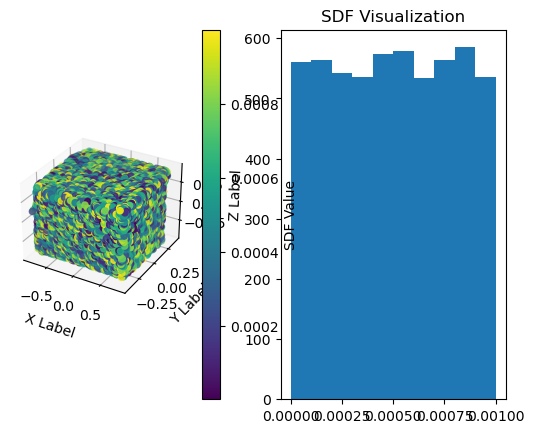

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from mesh_to_sdf import get_surface_point_cloud,scale_to_unit_cube, scale_to_unit_sphere, BadMeshException, sample_sdf_near_surface

def vis_sdf(data, sdf_threshold=0.01):
    # 获取xyz坐标和sdf值
    x = data[:, 0]
    y = data[:, 1]
    z = data[:, 2]
    sdf_values = data[:, 3]

    threshold = sdf_threshold

    x = x[sdf_values<threshold]
    y = y[sdf_values<threshold]
    z = z[sdf_values<threshold]

    sdf_values = sdf_values[sdf_values<threshold]

    # 创建一个新的3D图形
    fig = plt.figure()
    ax = fig.add_subplot(121, projection='3d')
    ax2 = fig.add_subplot(122)
    ax2.hist(sdf_values)

    # 使用SDF值作为颜色映射
    scatter = ax.scatter(x, y, z, c=sdf_values, cmap='viridis')
    plt.colorbar(scatter, ax=ax, label='SDF Value')

    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    plt.title('SDF Visualization')
    plt.show()

raw = np.load("/home/wiss/lhao/storage/user/hjp/ws_dditnach/DeepSDF/data/SdfSamples/canonical_mesh_manifoldplus/04256520/1b0432fd7b56f7e219fb4103277a6b93_scene0166_01_ins_7.npz")
data = raw['pos']
sdf_threshold=0.001
vis_sdf(data,sdf_threshold)

In [16]:
"""

比较DeepSDF原版生成到sdf采样数据和真实mesh的尺度差距

"""

import plotly.graph_objs as go
from plyfile import PlyData
import numpy as np

# sdf_path = "/home/wiss/lhao/storage/user/hjp/ws_dditnach/DeepSDF/data/SdfSamples/canonical_mesh_manifoldplus/04256520/1a4a8592046253ab5ff61a3a2a0e2484_scene0484_00_ins_1.npz"
# mesh_path = '/home/wiss/lhao/storage/user/hjp/ws_dditnach/DeepSDF/DATA/ScanARCW/canonical_mesh_manifoldplus/04256520/1a4a8592046253ab5ff61a3a2a0e2484_scene0484_00_ins_1/model_canonical_manifoldplus.obj'

sdf_path = "/home/wiss/lhao/storage/user/hjp/ws_dditnach/DeepSDF/data/SdfSamples/canonical_mesh_manifoldplus/04256520/6ebad671c5ccfee94c02d21d2fa4d397_scene0601_00_ins_7.npz"
mesh_path = "/home/wiss/lhao/storage/user/hjp/ws_dditnach/DeepSDF/DATA/ScanARCW/canonical_mesh_manifoldplus/04256520/6ebad671c5ccfee94c02d21d2fa4d397_scene0601_00_ins_7/model_canonical_manifoldplus.obj"

sdf_path = "/home/wiss/lhao/storage/user/hjp/ws_dditnach/DeepSDF/data/SdfSamples/canonical_mesh_manifoldplus/04256520/2abe8d5b5d29ff52f7628281ecb18112_scene0588_02_ins_17.npz"
mesh_path = "/home/wiss/lhao/storage/user/hjp/ws_dditnach/DeepSDF/DATA/ScanARCW/canonical_mesh_manifoldplus/04256520/2abe8d5b5d29ff52f7628281ecb18112_scene0588_02_ins_17/model_canonical_manifoldplus.obj"

sdf_path = "/home/wiss/lhao/storage/user/hjp/ws_dditnach/DeepSDF/data/SdfSamples/canonical_mesh_manifoldplus/04256520/7c9e1876b1643e93f9377e1922a21892_scene0329_01_ins_4.npz"
mesh_path = "/home/wiss/lhao/storage/user/hjp/ws_dditnach/DeepSDF/DATA/ScanARCW/canonical_mesh_manifoldplus/04256520/7c9e1876b1643e93f9377e1922a21892_scene0329_01_ins_4/model_canonical_manifoldplus.obj"

# 从OBJ文件加载网格数据
with open(mesh_path, 'r') as file:
    lines = file.readlines()

vertices = []
faces = []

for line in lines:
    if line.startswith('v '):
        vertex = line.split()[1:]
        vertices.append([float(vertex[0]), float(vertex[1]), float(vertex[2])])
    elif line.startswith('f '):
        face = line.split()[1:]
        face_indices = [int(idx.split('/')[0]) - 1 for idx in face]
        faces.append(face_indices)

mesh = go.Mesh3d(x=[v[0] for v in vertices], y=[v[1] for v in vertices], z=[v[2] for v in vertices],
                  i=[f[0] for f in faces], j=[f[1] for f in faces], k=[f[2] for f in faces])

#加载SDF值
raw = np.load(sdf_path)
data = raw['pos']
print(raw['scale_mesh2sdf'])
x = data[:, 0]
y = data[:, 1]
z = data[:, 2]
sdf_values = data[:, 3]

threshold = 0.0005

# x = x[sdf_values<threshold]
# y = y[sdf_values<threshold]
# z = z[sdf_values<threshold]

x = x[sdf_values<threshold]/raw['scale_mesh2sdf'] - raw['translation_mesh2sdf'][0]
y = y[sdf_values<threshold]/raw['scale_mesh2sdf'] - raw['translation_mesh2sdf'][1]
z = z[sdf_values<threshold]/raw['scale_mesh2sdf'] - raw['translation_mesh2sdf'][2]

trace = go.Scatter3d(x=x, y=y, z=z, mode='markers')
layout = go.Layout(scene=dict(
        aspectmode='data',  # Set the aspect ratio to 'cube' for equal scales
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
    ),)
fig = go.Figure(data=[trace,mesh], layout=layout)
fig.show()

[0.877599]


In [14]:
raw['scale_mesh2sdf']

array([0.877599], dtype=float32)

In [6]:
print(raw['scale_sdf2mesh'])

[1. 1. 1.]


In [10]:
import numpy as np

raw = np.load("/home/wiss/lhao/storage/user/hjp/ws_dditnach/DeepSDF/data/SdfSamples/canonical_mesh_manifoldplus/04256520/7c9e1876b1643e93f9377e1922a21892_scene0329_01_ins_4.npz")
print(raw.files)
print(raw['scale_mesh2sdf'])
print(raw['translation_mesh2sdf'])
"".join([chr(n) for n in raw['mesh_filename']])


['pos', 'neg', 'translation_mesh2sdf', 'scale_mesh2sdf', 'mesh_filename']
[0.877599]
[-0.00372851  0.029984   -0.01235551]


'DATA/ScanARCW/canonical_mesh_manifoldplus/04256520/7c9e1876b1643e93f9377e1922a21892_scene0329_01_ins_4/model_canonical_manifoldplus.obj'